# Star Wars Wordclouds with Python
by Rafael Schultze-Kraft

In [1]:
from IPython.display import Image
Image(url="https://raw.githubusercontent.com/neocortex/mining-star-wars/master/imgs/"
      "star_wars.png", width=900)

The present Jupyter notebook is small fun-project with the goal of visualising **Star Wars** characters as **word clouds** -- that is, represent Star Wars characters by the words that most charactarise them in terms of what they say in the movies (**Episodes I-VI**).<br>

To do so, I crawl the movie scipts of Star Wars Episodes I-VI, extract and process content spoken by each Star Wars character, and visualize each character as a word cloud.<br>

The notebook demostrates a few basic data science concepts and Python libraries on **web crawling** (using [requests](http://docs.python-requests.org/en/master/) and [beautifulsoup](https://pypi.python.org/pypi/beautifulsoup4)), **natural language processing** (using [NLTK](http://www.nltk.org/), `string`, and `re`), **word cloud** generation (using Andreas Müller's [wordcloud](https://github.com/amueller/word_cloud)), and **visualization** (using [matplotlib](http://matplotlib.org/)).

As data source for the movie scripts I use the [Internet Movie Script Database (IMSDb)](http://www.imsdb.com/). (As fair use for educational purpose only).

You can find this notebook add all the code on [GitHub](https://github.com/neocortex/mining-star-wars).
I also gave a [lightning talk](https://www.youtube.com/watch?v=nBcWwMJYCKI&feature=youtu.be&t=20m39s) about this at Europython 2016.

Let's get started!

*[This first command is simply to prevent the output of any warnings throughout this notebook]*

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Imports

First, let's ** import some libraries ** we will be needing. As mentioned above, for crawling the HMTLs containing the scripts of the movies I will be using a combination of [requests](http://docs.python-requests.org/en/master/) (to do the actual HTTP requests), and [beautifulsoup](https://pypi.python.org/pypi/beautifulsoup4) for parsing the HTMLs and retrieving the desired content. Moreover, the imports include some helper libraries (e.g. **collections**), things we need for string processing (**re**, **string**, and [nltk](http://www.nltk.org/), as well as [matplotlib](http://matplotlib.org/) for plotting, and [wordcloud](http://matplotlib.org/) for the generation of wordclouds.

In [3]:
from collections import Counter, defaultdict
import re
import string

import bs4
from bs4.element import NavigableString
import nltk
from nltk.corpus import stopwords
import requests
import pylab as pl
from wordcloud import WordCloud

%matplotlib inline

### Data

As mentioned above, I will be using the [Internet Movie Script Database (IMSDb)](http://www.imsdb.com/) as data source. In the following I specify a dictionary with the target URLs of each Star Wars episode in the IMSDb.

In [4]:
episodes = {'Episode I': 'http://www.imsdb.com/scripts/Star-Wars-The-Phantom-Menace.html',
            'Episode II': 'http://www.imsdb.com/scripts/Star-Wars-Attack-of-the-Clones.html',
            'Episode III': 'http://www.imsdb.com/scripts/Star-Wars-Revenge-of-the-Sith.html',
            'Episode IV': 'http://www.imsdb.com/scripts/Star-Wars-A-New-Hope.html',
            'Episode V': 'http://www.imsdb.com/scripts/Star-Wars-The-Empire-Strikes-Back.html',
            'Episode VI': 'http://www.imsdb.com/scripts/Star-Wars-Return-of-the-Jedi.html'}

### Crawling

### Episode IV - A New Hope

In [5]:
Image(url="https://upload.wikimedia.org/wikipedia/en/8/87/StarWarsMoviePoster1977.jpg",
      width=200)

I will be crawling the episodes in cronological order of appearance, hence I start with **Episode IV**.
Obtaining the script simply consists of a GET request to the goal URL. The content of the response is then converted into a beautifulsoup object.

In [6]:
res = requests.get(episodes.get('Episode IV'))
soup = bs4.BeautifulSoup(res.content)

In [7]:
type(res.content)

bytes

The raw HTML is a mess with of text, tags, JavaScript, etc. Luckily, beautifulsoup gives us the tools to parse the HTML in order to retrieve only the information that we want.<br>
So here is what needs to be done: In order to obtain spoken text for each character in the movie, we need to inspect the HTML tree and investigate how this content can be extracted.
Here is a partial screenshot of the rendered HTML of the script for Episode IV:<br>

In [9]:
Image(url="https://raw.githubusercontent.com/neocortex/mining-star-wars/master/imgs/"
      "ep4_script.png", width=500)

A quick inspection, shows that all spoken text is preceded by the character's name embedded in an HTML **`b`** tag (e.g. *THREEPIO*). However, so are location setting announcements (e.g. *INT. REBEL BLOCKADE RUNNER*). The difference is that the character's **`b`** tag is indented more than it is when it just denotes a location announcement (a quick inspection shows that the indention is in fact exaclty **37 spaces**). Hence the crawling approach I take here is to iterate over all **`b`** tags in the soup, and check if the **`b`** tag is in fact indented at least 37 spaces (otherwise it's just a location announcement). If this is the case, then the **`next sibling`** of the **`b`** tag will give me the character's spoken text.<br>
Finally, I iterate over each line of the dialogue (until I find an empty line) and filter out those lines that start with a `(`, which indicates a description and is not part of the dialogue.<br>

Sounds complicated, but it fact it's really easy. Here is how the code looks like:

In [10]:
# get all b tags from the HTML
bolds = soup.findAll('b')

In [11]:
# define a default dictionary to which all spoken words of each character will be appended to
characters_4 = defaultdict(str)

In [12]:
# iterate over each bold tag
for b in bolds:
    # make sure the the indention is larger than a certain value, else continue
    if len(b.text) - len(b.text.lstrip()) < 37:
        continue
    # iterate over each line of the dialogue
    for t in b.nextSibling.split('\n'):
        # stop if we hit a blank line
        if not t:
            break
        stripped = t.strip()
        # if line does not start with a '(' character, append the text to the default dict
        if not stripped.startswith('('):
            characters_4[b.text.strip()] += ' ' + stripped

The result of the crawl is a dictionary of the format `{character name: spoken text}`. This shows the list of the top 10 characters in Episode IV, sorted by the amount of spoken words:

In [13]:
sorted(characters_4, key=lambda k: len(characters_4[k]), reverse=True)[:10]

['LUKE',
 'HAN',
 'THREEPIO',
 'BEN',
 'LEIA',
 'BIGGS',
 'VADER',
 'TARKIN',
 'OWEN',
 'RED LEADER']

And here is an example entry in the dictionary (for **Darth Vader**):

In [14]:
wrap(characters_4.get('VADER'), 80)[:30]

[' Where are those transmissions you intercepted? What have you done with those',
 'plans? If this is a consular ship... were is the Ambassador? Commander, tear',
 "this ship apart until you've found those plans and bring me the Ambassador. I",
 "want her alive! Don't play games with me, Your Highness. You weren't on any",
 'mercy mission this time. You passed directly through a restricted system.',
 'Several transmissions were beamed to this ship by Rebel spies. I want to know',
 "what happened to the plans they sent you. You're a part of the Rebel Alliance...",
 'and a traitor. Take her away! I have traced the Rebel spies to her. Now she is',
 'my only link to find their secret base! Leave that to me. Send a distress signal',
 'and then inform the senate that all aboard were killed! She must have hidden the',
 'plans in the escape pod. Send a detachment down to retrieve them. See to it',
 "personally, Commander. There'll be no one to stop us this time. The plans you",
 "refer to will

So far so good! Let's move on to the next episode ...

### Episode V - The Empire Strikes Back

In [15]:
Image(url='https://upload.wikimedia.org/wikipedia/en/3/3c/SW_-_Empire_Strikes_Back.jpg',
      width=200)

For *Episode V* crawling is essentially identical, with the only difference that the identation of the **`b`** tag that discriminates between a location setting and a character dialogue is different: This time it is encoded in tabs and not spaces. Other than that, the dialogue extraction procedure is equivalent:

In [16]:
# get request for episode V
res = requests.get(episodes.get('Episode V'))
# create soup object
soup = bs4.BeautifulSoup(res.content)

In [17]:
# get all bold tags from the HTML
bolds = soup.findAll('b')

In [18]:
# define a dictionary to store all characters' dialogues from this episode
characters_5 = defaultdict(str)

In [19]:
# iterate over all bold tags
for b in bolds:
    # check if number of identation tabs equals 4
    if len(b.text) - len(b.text.lstrip()) != 4:
        continue
    # iterate over each line
    for t in b.nextSibling.split('\n'):
        # if line is blank, break
        if not t:
            break
        stripped = t.strip()
        # append to dictionary if line does not start with character '('
        if not stripped.startswith('('):
            characters_5[b.text.strip()] += ' ' + stripped

Top 10 characters in Episode V sorted by amount of spoken text:

In [20]:
sorted(characters_5, key=lambda k: len(characters_5[k]), reverse=True)[:10]

['HAN',
 'THREEPIO',
 'LUKE',
 'LEIA',
 'VADER',
 'LANDO',
 'YODA',
 'PIETT',
 'CREATURE',
 'RIEEKAN']

Moving on...

### Episode VI - Return of the Jedi

In [21]:
Image(url='https://upload.wikimedia.org/wikipedia/en/b/b2/ReturnOfTheJediPoster1983.jpg',
      width=200)

Extracting dialogues in *Return of the Jedi* is a bit different than in the episodes before. Again character dialogues are announced in **`b`** tags and so are location settings. However, now the major distinction between both is that location settings are preceeded by a digit (which is not the case for dialogues):

In [22]:
Image(url="https://raw.githubusercontent.com/neocortex/mining-star-wars/master/imgs/"
      "ep6_script.png", width=500)

Hence, we simply iterate over the **`b`** tags check if the content begins if a digit, and do essentially the same as before if that is not the case.

In [23]:
# make get request and extract HTML content using bs4
res = requests.get(episodes.get('Episode VI'))
soup = bs4.BeautifulSoup(res.content)

In [24]:
# extract all b tags from HTML, skip the script heading
bolds = soup.findAll('b')
bolds = bolds[5:]

In [25]:
# instantiate default dict
characters_6 = defaultdict(str)

In [26]:
# iterated over b tags
for i, b in enumerate(bolds):
    # check if first character is a digit
    if b.text[0].isdigit():
        continue
    # make sure next sibling is a string
    if type(b.nextSibling) != NavigableString:
        continue
    # iterate over each line
    for t in b.nextSibling.split('\n'):
        # if line is empty, we're done
        if not t:
            break
        stripped = t.strip()
        # if line does not start with '(' char, append to dict
        if not stripped.startswith('('):
            c = b.text.strip().split('\t')[0]
            characters_6[c] += ' ' + stripped

In [27]:
sorted(characters_6, key=lambda k: len(characters_6[k]), reverse=True)[:10]

['THREEPIO',
 'LUKE',
 'HAN',
 'EMPEROR',
 'BEN',
 'VADER',
 'LANDO',
 'LEIA',
 'ACKBAR',
 'YODA']

### Episode I - The Phantom Menace

In [28]:
Image(url='https://upload.wikimedia.org/wikipedia/en/4/40/Star_Wars_Phantom_Menace_poster.jpg',
      width=200)

For *Episode I* text extraction again differs from our previous approaches. By inspecting the HTML source we first find that the script's content is written in a **`pre`** tag. Hence the first step is to extract that content.  

In [29]:
# make get request and extract response content
res = requests.get(episodes.get('Episode I'))
soup = bs4.BeautifulSoup(res.content)

In [30]:
# find the `pre` tag in the HTML
raw = soup.find('pre')

In [31]:
# instantiate default dict
characters_1 = defaultdict(str)

The dialogue extraction consists of iterating over the children of the above extracted element. Each segment of those children is retrieved by splitting at double new-line characters (**`\n\n`**). Furthermore, a dialogue is indicated by the character's name followd by a colon - hence if splitting the line by a colon does not reveal more than a single entry, the current line is not part of a dialogue. And finally, I make sure the current line is a dialogue by checking that the first entry of the split object is upper-case (indicating the character's name) and remove text embedded in brackets.

In [32]:
Image(url="https://raw.githubusercontent.com/neocortex/mining-star-wars/master/imgs/"
      "ep1_script.png", width=500)

In [33]:
# iterate of all children of the pre HTML tag
for child in raw.children:
    # make sure tupe is a string
    if type(child) != NavigableString:
        continue
    # split by two subsequent newline characters
    l = child.split('\n\n')
    # iterate of each line
    for s in l:
        s = s.split('\n')
        dialogue = False
        for x in s:
            # split by colon character
            content_list = x.split(':')
            # if length of split is one, continue with next line
            if (len(content_list) == 1) and (not dialogue):
                continue
            # if first entry of split is in upper case
            if content_list[0].isupper():
                # remove text in brackets
                content = re.sub(r'\([^)]*\)', '', ' '.join(content_list[1:])).strip()
                character = content_list[0].strip() 
                dialogue = True
                # append to dict
                characters_1[character] += ' ' + content
                continue
            if dialogue:
                content = re.sub(r'\([^)]*\)', '', ' '.join(content_list)).strip()
                characters_1[character] += ' ' + content

In [34]:
sorted(characters_1, key=lambda k: len(characters_1[k]), reverse=True)[:10]

['QUI-GON',
 'ANAKIN',
 'PADME',
 'OBI-WAN',
 'JAR JAR',
 'AMIDALA',
 'PALPATINE',
 'NUTE',
 'WATTO',
 'CAPT. PANAKA']

### Episode II - Attack of the Clones

In [35]:
Image(url='https://upload.wikimedia.org/wikipedia/en/3/32/'
      'Star_Wars_-_Episode_II_Attack_of_the_Clones_(movie_poster).jpg',
      width=200)

Dialoge text extraction in *Attack of the Clones* is similar to Episode V. I again iterate over **`b`** tags and make sure that the indentation length equals 4. On top of that I check whether the indentation of each line within the **`b`** tag is exactly 3 - this ensures that the text in this line is actual spoken text (and not other script instructions). This can be found by checking the HTML source.

In [36]:
# make get request and extract HTML content
res = requests.get(episodes.get('Episode II'))
soup = bs4.BeautifulSoup(res.content)

In [37]:
# get all b tags
bolds = soup.findAll('b')

In [38]:
# init default dict for this episode
characters_2 = defaultdict(str)

In [39]:
# itereate of all b tags
for b in bolds:
    # make sure identation equals 4
    if len(b.text) - len(b.text.lstrip()) != 4:
        continue
    # split each line
    for t in b.nextSibling.split('\n'):
        # make sure identation equals 3
        if len(t) - len(t.lstrip()) != 3:
            continue
        stripped = t.strip()
        # append to dict
        characters_2[b.text.strip()] += ' ' + stripped

In [40]:
sorted(characters_2, key=lambda k: len(characters_2[k]), reverse=True)[:10]

['ANAKIN',
 'PADMÉ',
 'OBI-WAN',
 'PADME',
 'PALPATINE',
 'MACE WINDU',
 'YODA',
 'LAMA SU',
 'JAR JAR',
 'JOCASTA NU']

## Episode III - Revenge of the Sith

In [41]:
Image(url='https://upload.wikimedia.org/wikipedia/en/9/93/
      'Star_Wars_Episode_III_Revenge_of_the_Sith_poster.jpg', width=200)

And finally, the last episode! After HTML inspections, dialogue text extraction here turns to be fairly easy: We simply interate over the HMTL body's lines (splitting at double linebreaks **`\n\n`**) -- if a line contains a colon and it's first entry is upper-case, the current line is dialogue text and the character is encoded by the string before the colon...that's all we need to do here!

In [42]:
Image(url="https://raw.githubusercontent.com/neocortex/mining-star-wars/master/imgs/"
      "ep3_script.png", width=300)

In [43]:
# make get request, extract HTML content
res = requests.get(episodes.get('Episode III'))
soup = bs4.BeautifulSoup(res.content)

In [44]:
# get HMTL's body element
bod = soup.find('body')

In [45]:
# init default dict for this episode
characters_3 = defaultdict(str)

In [46]:
# iterate over each line in body elemnent
for b in bod.text.split('\n\n'):
    # split line by colon
    content_list = b.split(':')
    # if length of split is only 1, continue to next line
    if len(content_list) == 1:
        continue
    # if first entry of split is upper-case, append dialogue text
    if content_list[0].isupper():
            # remove text in brackets
            content = re.sub(r'\([^)]*\)', '', ' '.join(content_list[1:])).strip()
            characters_3[content_list[0].strip()] += ' ' + content

In [47]:
sorted(characters_3, key=lambda k: len(characters_3[k]), reverse=True)[:10]

['ANAKIN',
 'OBI-WAN',
 'PALPATINE',
 'PADME',
 'YODA',
 'BAIL ORGANA',
 'GENERAL GRIEVOUS',
 'C-3PO',
 'MACE',
 'MON MOTHMA']

## Combining All

Now that we have all dialogue text extracted from all episodes, we will combine all dialogue texts from each episode into a single dictionary. Admittedly, we could have used a single dictionary for all episodes from the beginning. The reason I chose not to do so, is in case one wants to do some analysis between episodes.

In [48]:
# append all dictionaries into a single list
episodes_list = [characters_1, characters_2, characters_3, characters_4, characters_5,
                 characters_6]

In [49]:
# iterate over each dict and combine into a single one (there might be actually
# nicer ways to do this)
combined_episodes = defaultdict(str)
for ep in episodes_list:
    for k, v in ep.items():
        combined_episodes[k] += ' ' + v

In [50]:
sorted(combined_episodes, key=lambda k: len(combined_episodes[k]), reverse=True)[:100]

['ANAKIN',
 'OBI-WAN',
 'LUKE',
 'HAN',
 'THREEPIO',
 'PALPATINE',
 'PADME',
 'QUI-GON',
 'YODA',
 'LEIA',
 'PADMÉ',
 'BEN',
 'VADER',
 'JAR JAR',
 'LANDO',
 'AMIDALA',
 'MACE WINDU',
 'WATTO',
 'C-3PO',
 'EMPEROR',
 'BAIL ORGANA',
 'NUTE',
 'BIGGS',
 'TARKIN',
 'SHMI',
 'CAPT. PANAKA',
 'COUNT DOOKU',
 'LAMA SU',
 'DARTH SIDIOUS',
 'OWEN',
 'JOCASTA NU',
 'DOOKU',
 'GENERAL GRIEVOUS',
 'MACE',
 'PIETT',
 'RED LEADER',
 'JABBA',
 'MON MOTHMA',
 'ACKBAR',
 'BOSS NASS',
 'CREATURE',
 'B',
 'DODONNA',
 'WEDGE',
 'BIBBLE',
 'DEXTER JETTSTER',
 'MAS AMEDDA',
 'A',
 'QUEEN JAMILLIA',
 'TAUN WE',
 'RIEEKAN',
 'RIC OLIE',
 'OFFICER',
 'CLIEGG',
 'VALORUM',
 'TROOPER',
 'RUNE',
 'CAPTAIN TYPHO',
 'SIO BIBBLE',
 'MOTTI',
 'GREEDO',
 'VEERS',
 'PK-4',
 'TAGGE',
 'NUTE GUNRAY',
 'COMMANDER',
 'NEEDA',
 'GOLD LEADER',
 'SOLA',
 'CLONE COMMANDER CODY',
 'JOBAL',
 'SEBULBA',
 'NINEDENINE',
 'RUWEE',
 'LOTT DOD',
 'MEDICAL DROID',
 'DECK OFFICER',
 'OOM-9',
 'SENATOR ASK AAK',
 'ZEV',
 'KITSTER',
 'DA

The careful reader might have noticed that there are separate entries for spoken text that actually belong to the same character, e.g. `'BEN'` and `'BEN'S VOICE'` or `'PADM\xc9'` and `'PADME'`. Hence, in the next step I define a simple function that merges those entries into the same key. I intenionally decided to keep `OBI-WAN` (as denoted in episodes I-III) and `BEN` (episodes IV-VI) separated.

In [51]:
def merge_entries(dic, tuples):
    for keep, drop in tuples:
        dic[keep] += ' ' + dic[drop]
        del dic[drop]
    return dic

In [52]:
combined_episodes = merge_entries(combined_episodes, [#('OBI-WAN', 'BEN'),
                                                      ('ANAKIN', 'ANAKN'),
                                                      ('ANAKIN', 'ANAKINN'),
                                                      ('BEN', 'BEN\'S VOICE'),
                                                      ('COUNT DOOKU', 'DOOKU'),
                                                      ('CAPT. PANAKA', 'PANAKA'),
                                                      ('DARTH VADER', 'VADER'),
                                                      ('DARTH SIDIOUS', 'DABTH SIDIOUS'),
                                                      ('HAN', 'HAN\'S VOICE'),
                                                      ('LUKE', 'LUKE\'S VOICE'),
                                                      ('MACE WINDU', 'MACE-WINDU'),
                                                      ('MACE WINDU', 'WINDU'),
                                                      ('OBI-WAN', 'OBI-WAM'),
                                                      ('OBI-WAN', 'OBI-WAN (V.O.)'),
                                                      ('PADME', 'AMIDALA'),
                                                      ('PADME', u'PADM\xc9'),
                                                      ('PADME', 'PAMDE'),
                                                      ('QUI-GON', 'QUI -GON'),
                                                      ('THREEPIO', 'C-3PO')])

And once again, the top 20 characters over the all six episodes sorted by the amount of spoken text:

In [53]:
sorted(combined_episodes, key=lambda k: len(combined_episodes[k]), reverse=True)[:20]

['ANAKIN',
 'PADME',
 'OBI-WAN',
 'LUKE',
 'THREEPIO',
 'HAN',
 'PALPATINE',
 'QUI-GON',
 'YODA',
 'LEIA',
 'BEN',
 'DARTH VADER',
 'JAR JAR',
 'LANDO',
 'COUNT DOOKU',
 'MACE WINDU',
 'WATTO',
 'EMPEROR',
 'BAIL ORGANA',
 'NUTE']

## Further Text Preprocessing

For further text pre-processing and wordcloud generation I chose only the following popular characters:

In [54]:
chosen = [u'OBI-WAN', u'ANAKIN', u'PADME', u'THREEPIO', u'LUKE', u'HAN', u'PALPATINE', u'YODA',
          u'QUI-GON', u'LEIA', u'DARTH VADER', u'JAR JAR', u'LANDO', u'CAPT. PANAKA',
          u'COUNT DOOKU', 'EMPEROR', 'BEN']

In [55]:
characters = dict([(k, v) for k, v in combined_episodes.items() if k in chosen])

### Stopwords

The next step is to remove stopwords from the extracted text. For stopword removal I used three different sources: Two list of english stopwords I found through a quick Google search, and the list of stopwords provided by the [NLTK Python library](http://www.nltk.org/).

In [56]:
# read first stopwords list from file
with open('stopwords-1.csv') as f:
    stop_words = [x.strip() for x in f.read().split(',')]

In [57]:
# read second stopwords list from file
with open('stopwords-2.csv') as f:
    extended_stopwords = [x.strip() for x in f.readlines()]
    extended_stopwords = [x for x in extended_stopwords if x]

In [58]:
# you might need to run this in order to download the stopword list from NLTK
# nltk.download()

In [59]:
# combine stopwords from all sources
stop_words += stopwords.words('english')
stop_words += extended_stopwords
stop_words = set(stop_words)

### Text cleaning

The cleaning process consits of the following steps:

(1) Remove punctuation<br>
(2) Re-add punctuation for selected characters (e.g. **`r2 d2`** should be treated as a single term **`r2-d2`**)<br>
(3) Remove special characters such as tabs and newlines<br>
(4) Remove stopwords and split text into list of words

In [60]:
rm_punctuation_map = dict((ord(char), u' ') for char in string.punctuation)
repls = ('jar jar', 'jar-jar'), ('obi wan', 'obi-wan'), ('qui gon', 'qui-gon'), \
    ('r2 d2', 'r2-d2'), (u'padm\xe9', 'padme')
    
from functools import reduce

def string_cleaning(characters):
    cleaned = dict()
    for k, v in characters.items():
        txt = v.translate(rm_punctuation_map).lower()
        txt = re.sub(r'\s+', ' ', txt)
        txt = reduce(lambda a, kv: a.replace(*kv), repls, txt)
        cleaned[k] = [word for word in txt.split(' ') if word not in stop_words and word != '']
    return cleaned

In [61]:
cleaned = string_cleaning(characters)

Let's have a look at how the cleaned text looks like for an example character (**Darth Vader**):

In [62]:
wrap(' '.join(cleaned.get('DARTH VADER')), 80)[:30]

['separatists care master thank master lord yes master padme safe alive alive',
 'impossible transmissions intercepted plans consular ship ambassador commander',
 'tear ship apart found plans bring ambassador alive play games highness mercy',
 'mission time passed directly restricted system transmissions beamed ship rebel',
 'spies happened plans sent rebel alliance traitor traced rebel spies link secret',
 'base leave send distress signal inform senate aboard killed hidden plans escape',
 'pod send detachment retrieve personally commander stop time plans refer soon',
 'hands proud technological terror constructed ability destroy planet',
 'insignificant power force lack faith disturbing wish highness discuss location',
 'hidden rebel base resistance mind probe considerable time extract information',
 'mean commence primary ignition told consciously betray rebellion trying return',
 'stolen plans princess droids send scanning crew board ship checked sense',
 'presence tremor force time

### Wordclouds 
Time to create some wordclouds!<br>
To do so, for each character in the cleaned dictionary, we count the number each word appears (using `Counter` from the `collections` library), and feed this into the wordcloud library (it's as easy as instantiation the `WordCloud` class with the list of words and their frequencies - in fact you can also use plain text). We then use `matplotlib` to display the wordclouds.

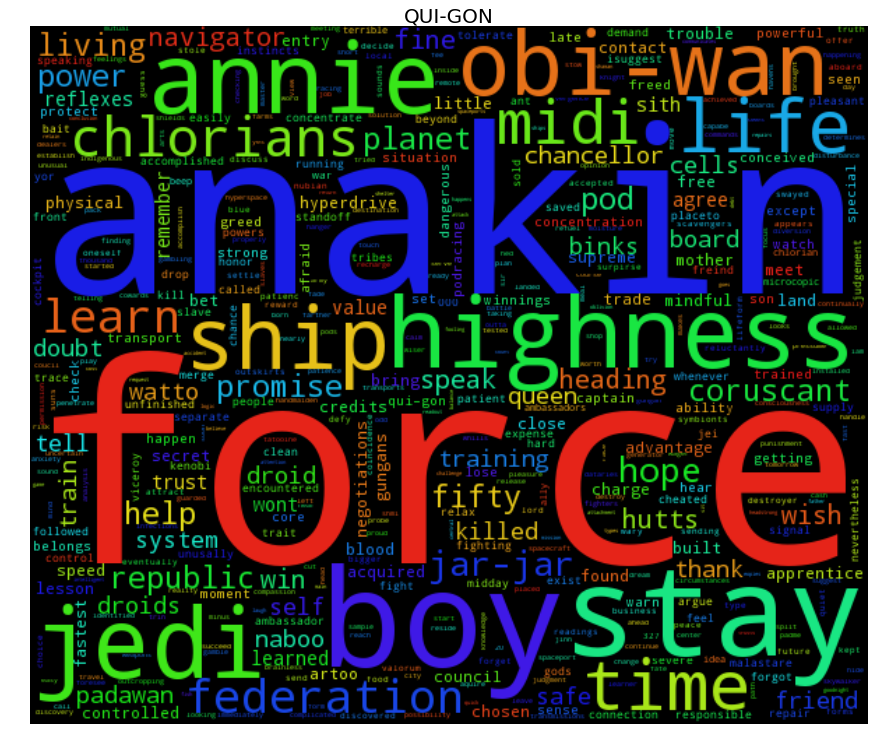

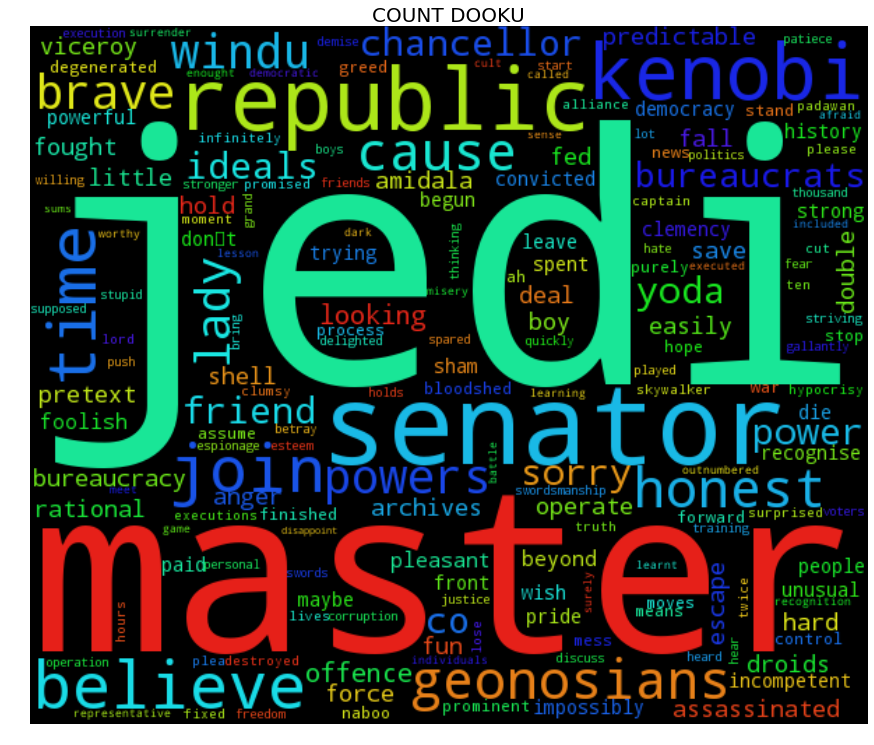

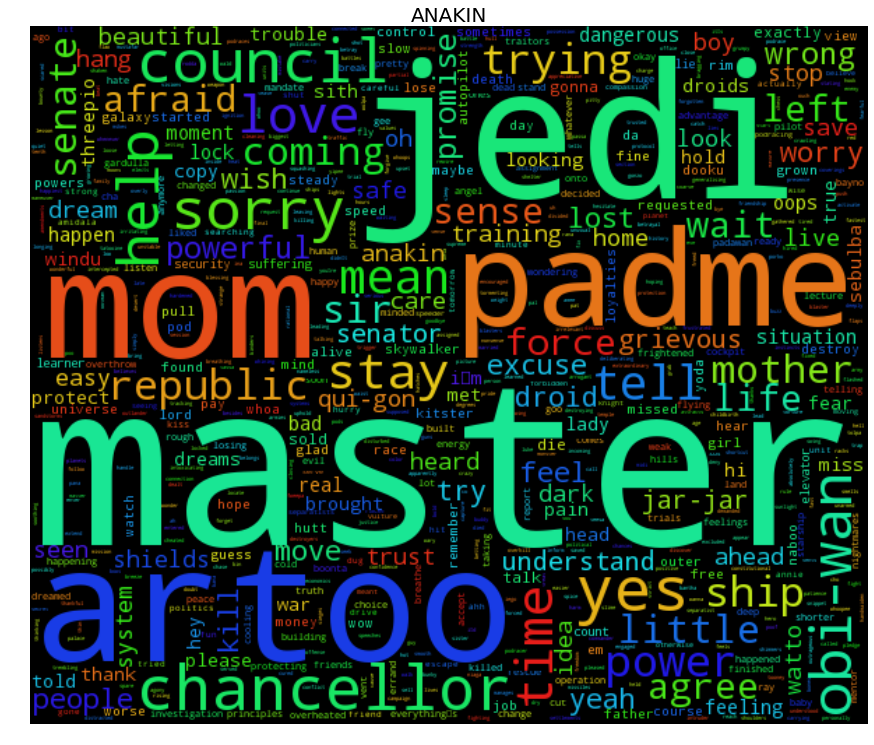

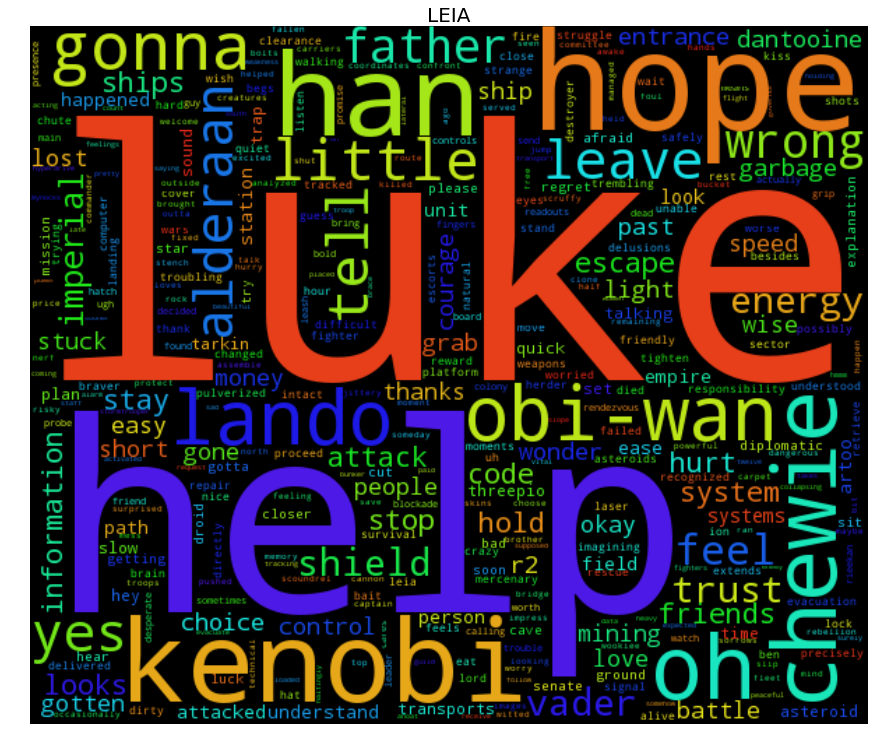

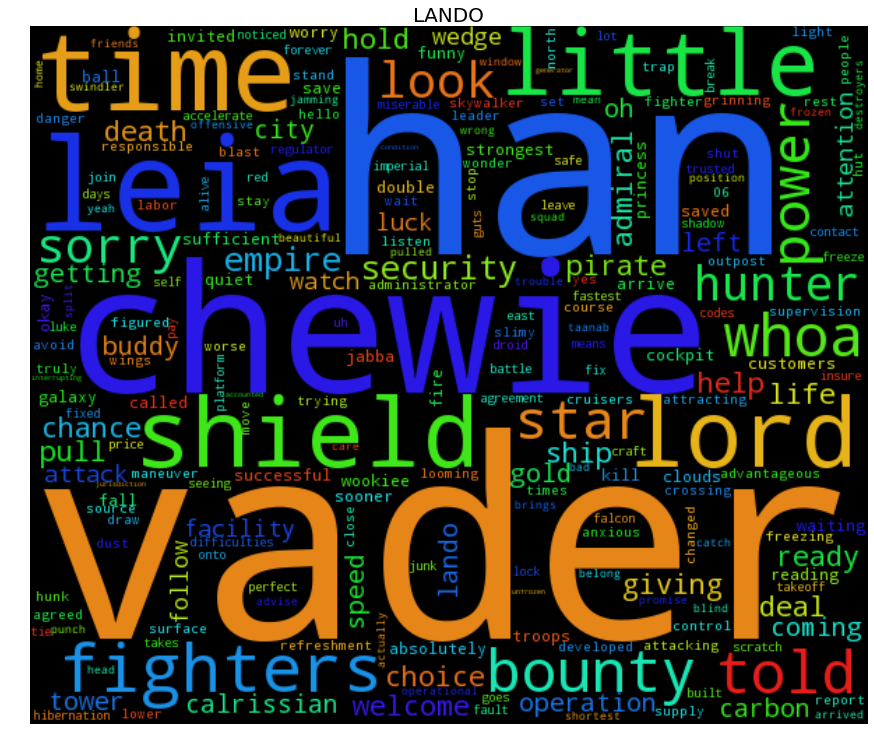

...

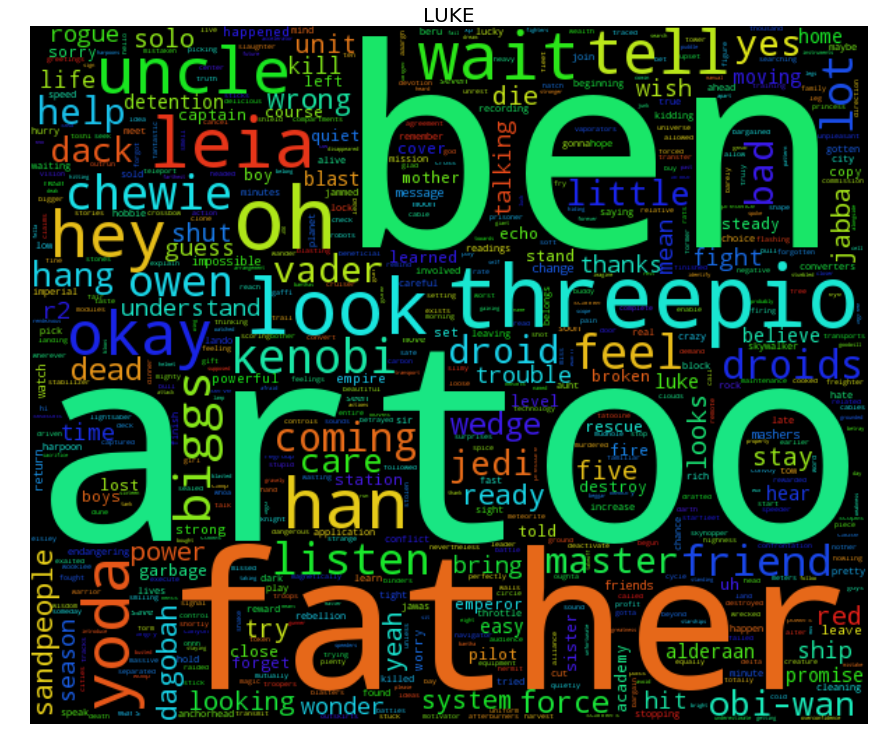

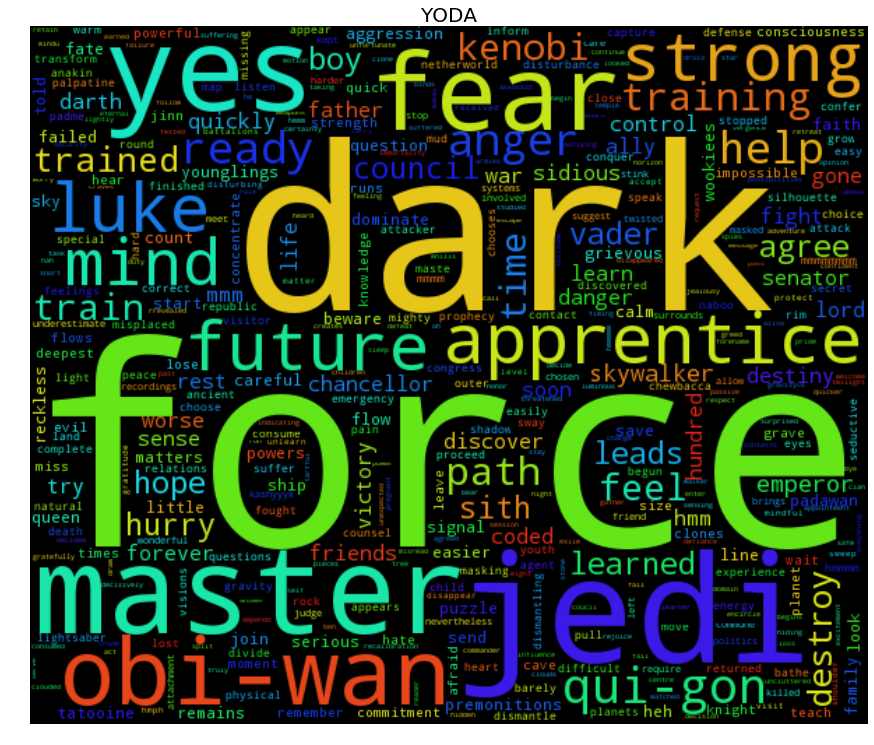

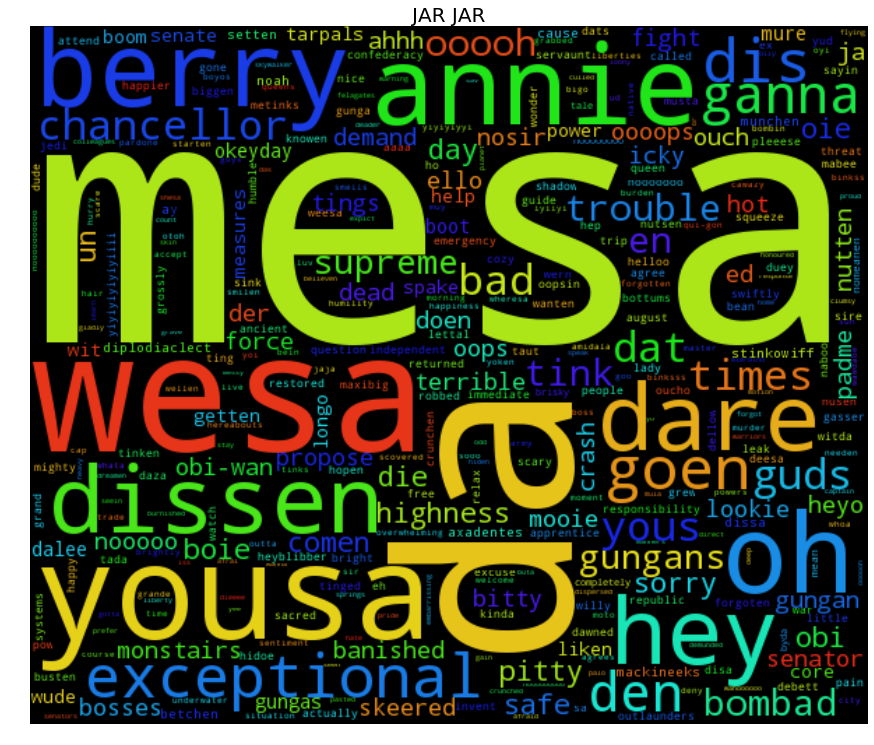

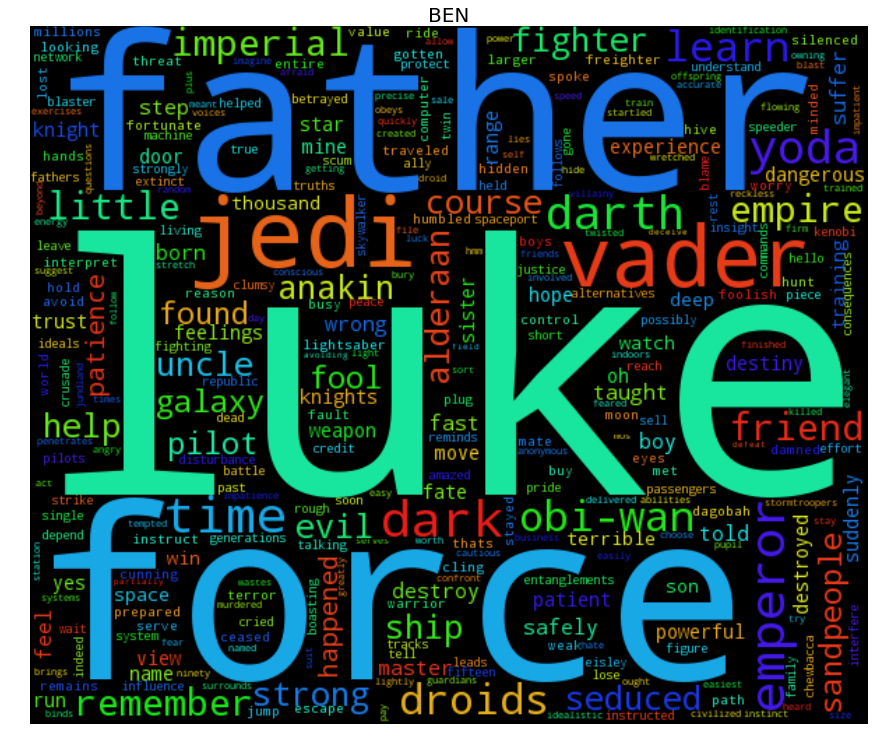

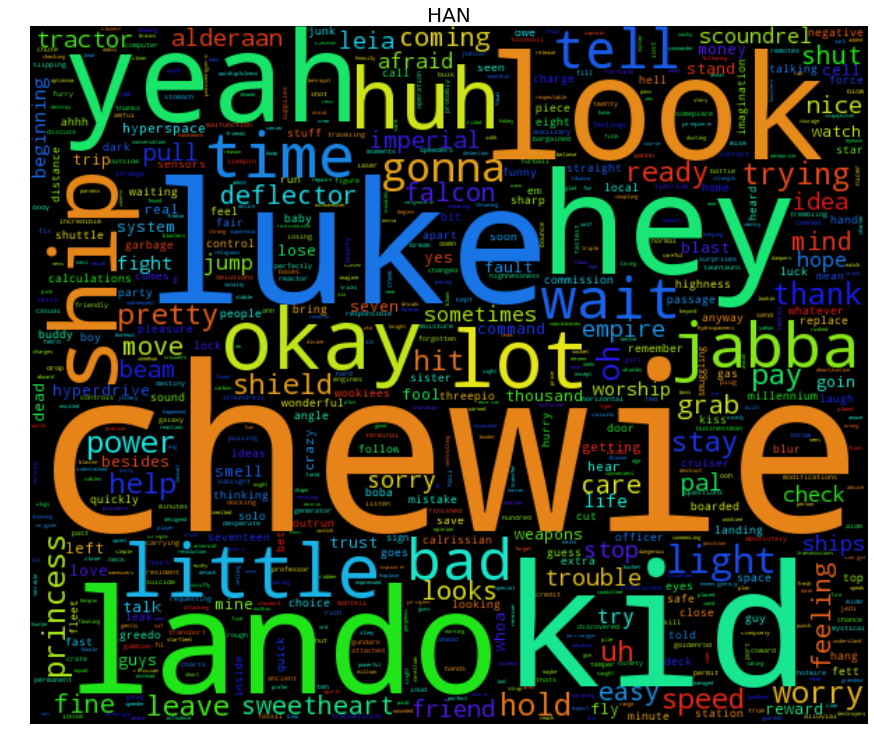

In [63]:
for k, v in cleaned.items():
    text = ' '.join(v)
    frequencies = Counter(text.split(' ')) 
    wordcloud = WordCloud(relative_scaling=.5, width=600, height=500, background_color='black',
                          max_words=1000).generate_from_frequencies(frequencies.items())
    pl.figure(figsize=(15, 15))
    pl.imshow(wordcloud)
    pl.axis('off')
    pl.title(k, fontsize=20)
    pl.show()

** Nice! ** <br>
But let's do a bit more: Wordcloud let's us specify a mask that will be used in order to give our wordclouds a particular shape.<br>

In addition we can play with different colormaps. Here, I define a color function that returns random HSL colors with in a given range of HUE values.

In [64]:
from random import randint

def cfunc(word=None, font_size=None, position=None,
          orientation=None, font_path=None, random_state=None, hrange=None):
    return 'hsl({}, 100%, {}%)'.format(randint(hrange[0], hrange[1]), randint(0, 40))

In [65]:
# some imports
from functools import partial
import numpy as np
from skimage.io import imread
from skimage.transform import resize

Next, I specify a list of filenames containing the images for the masks we will be using for the wordclouds.

In [66]:
mask_names = {'LUKE': 'luke.png', 'HAN': 'han.png', 'DARTH VADER': 'vader.png',
              'PADME': 'padme.jpg', 'OBI-WAN': 'obi_wan.jpg', 'YODA': 'yoda.png',
              'EMPEROR': 'death_star.jpg', 'THREEPIO': 'threepio.png',
              'LANDO': 'cloud_city.jpg'}

AND FINALLY...

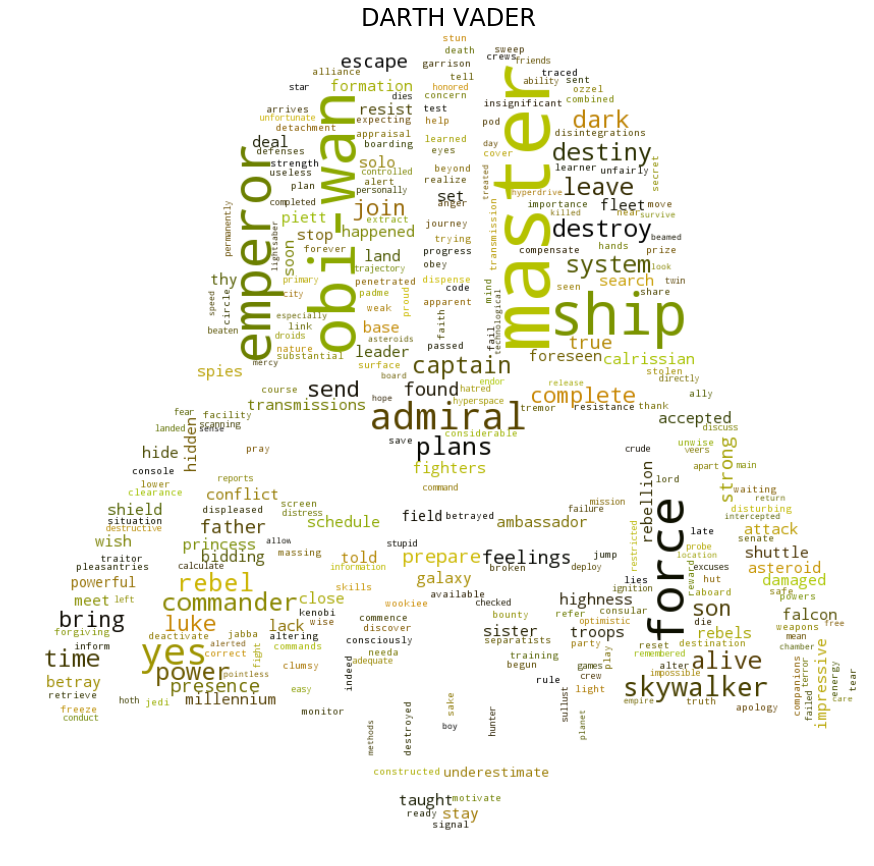

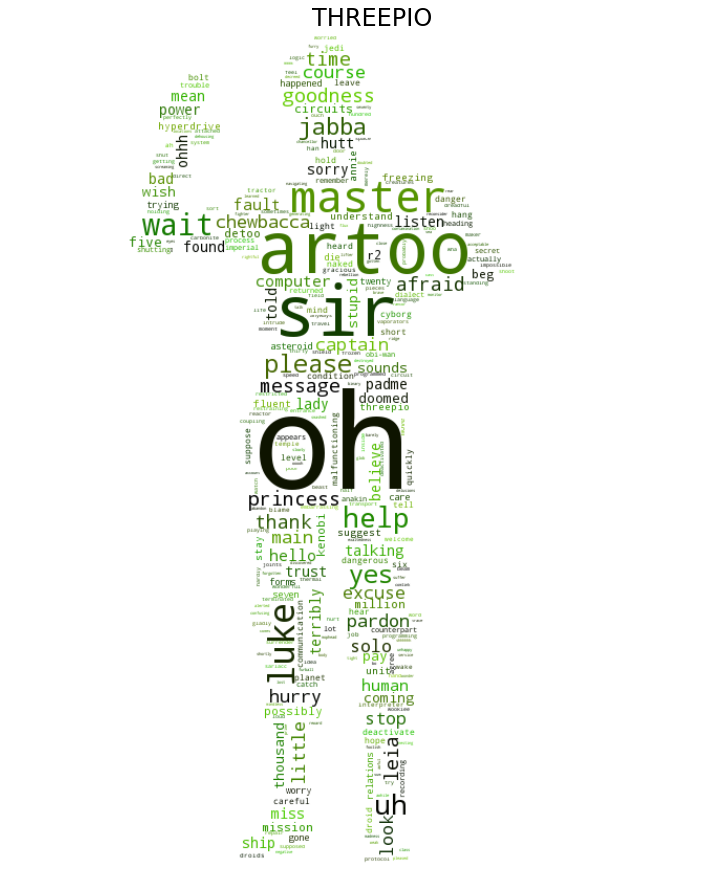

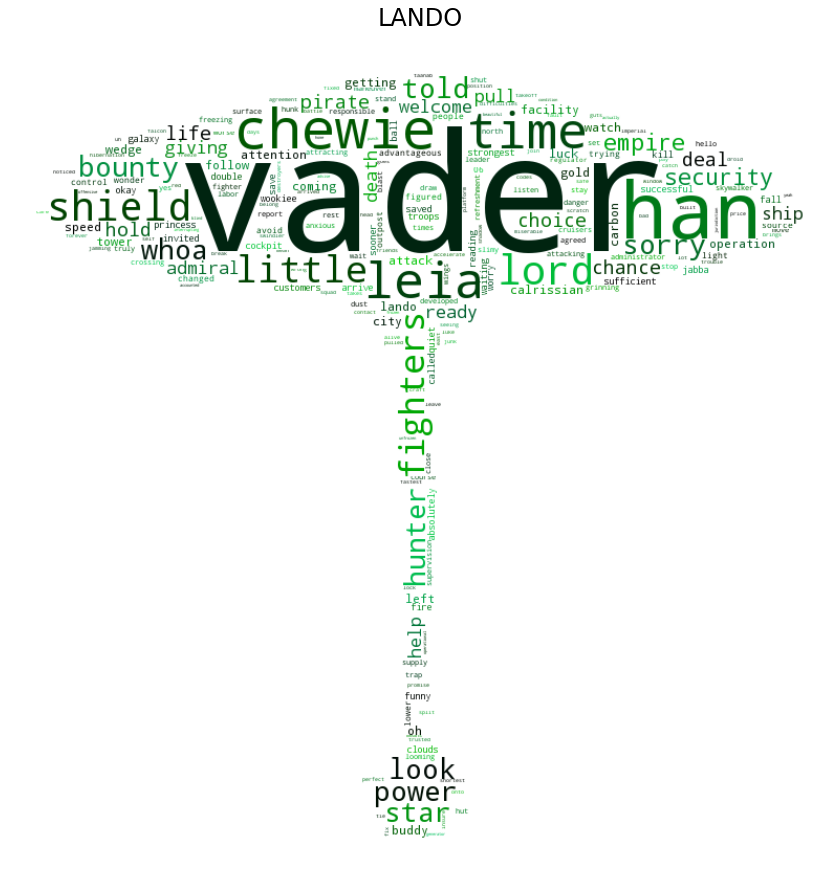

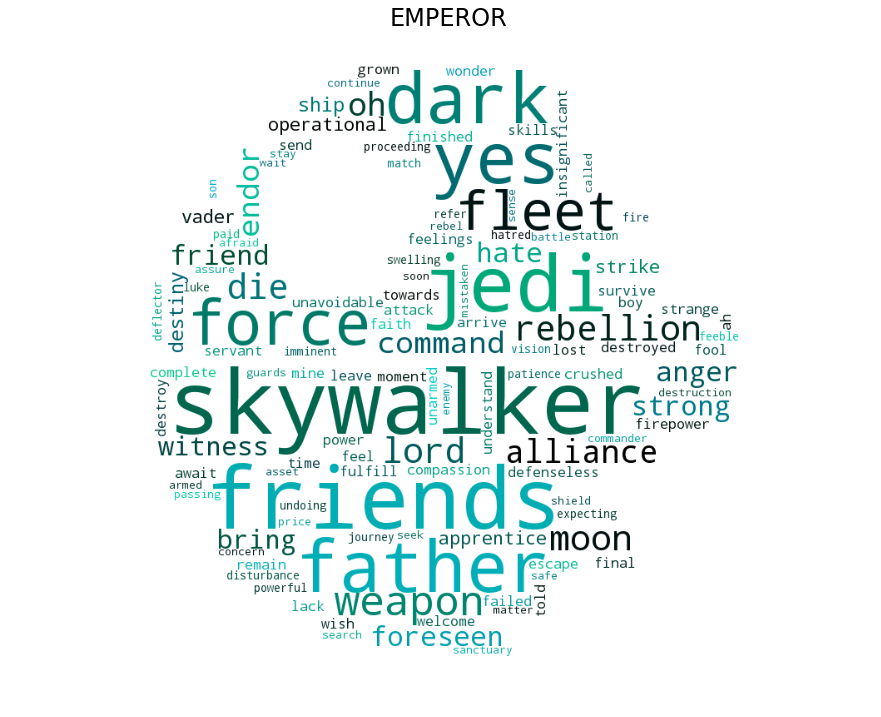

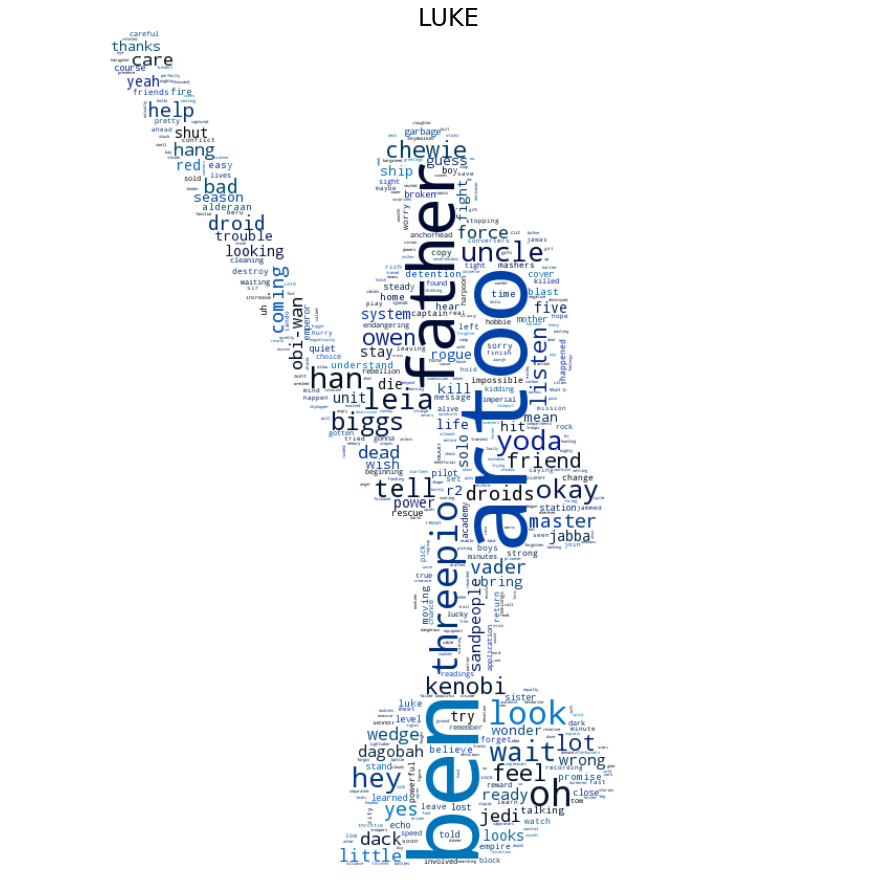

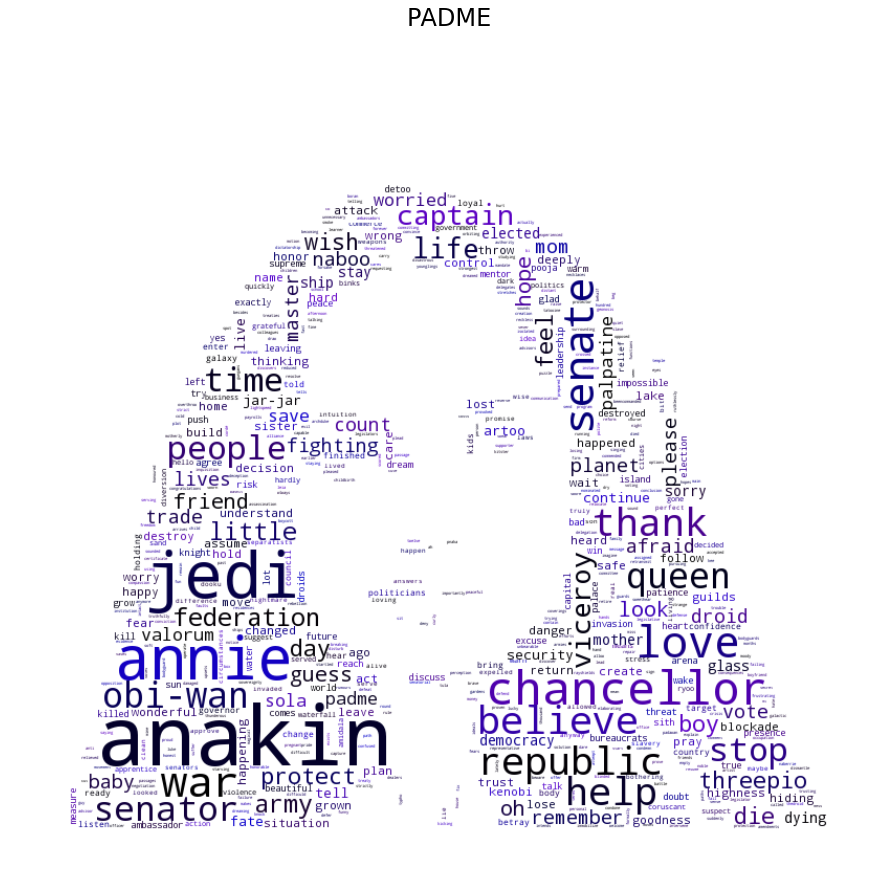

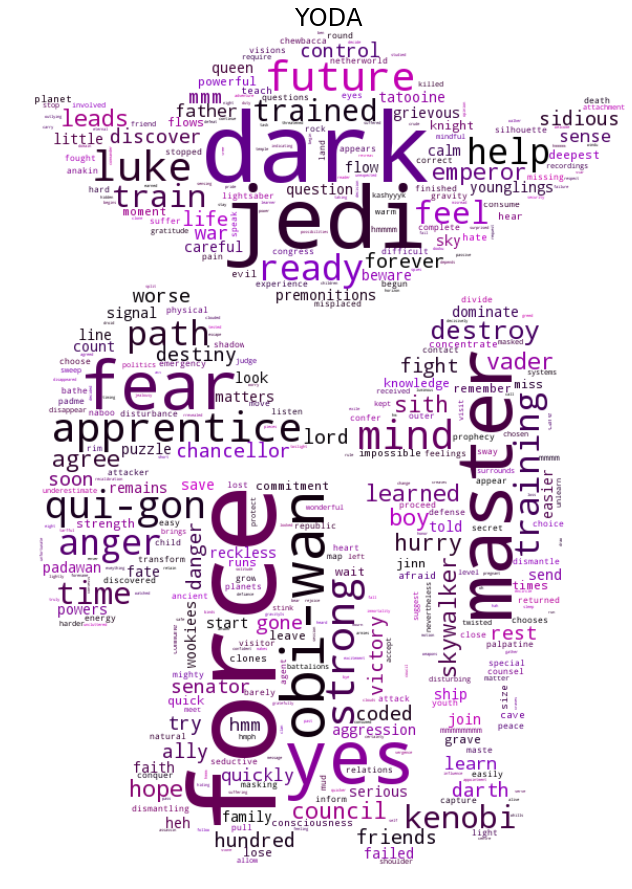

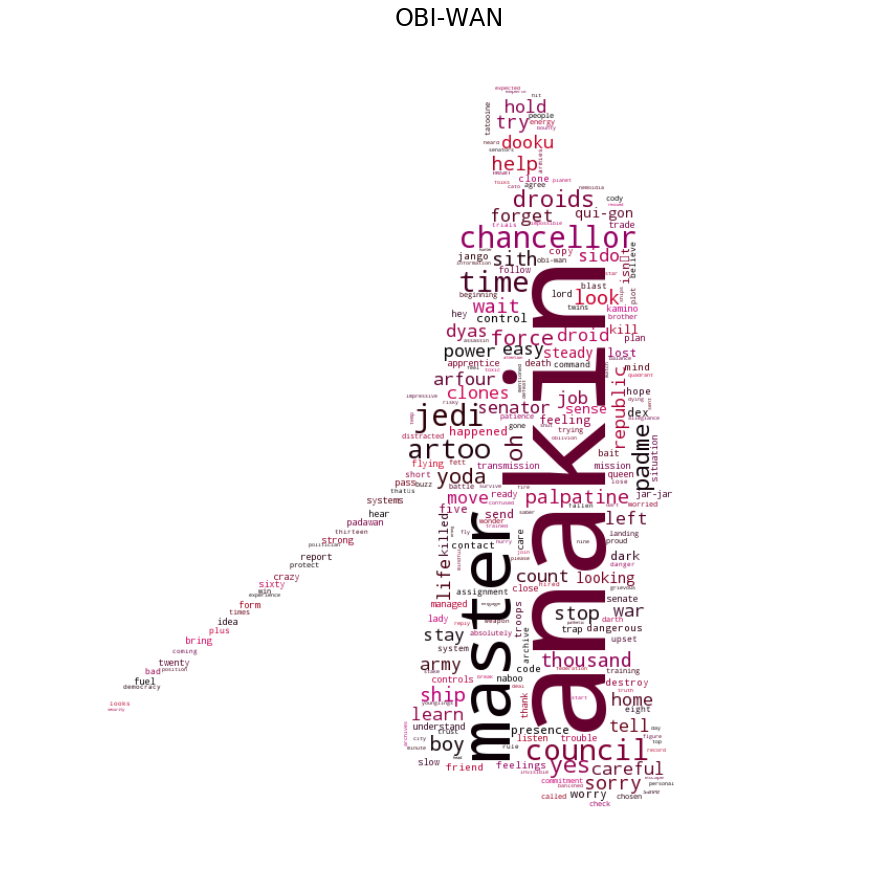

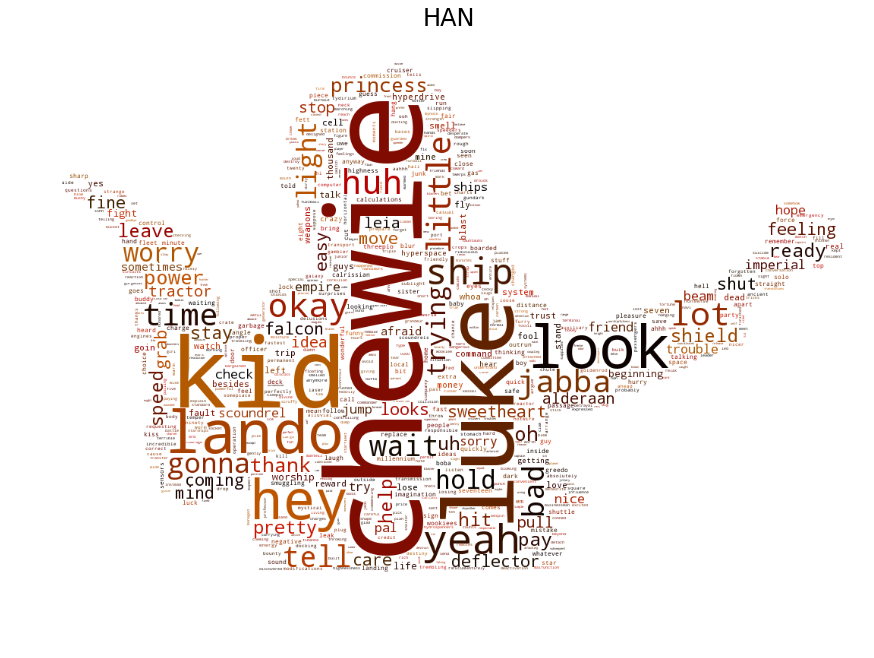

In [67]:
hrange = np.array([0, 30])

for name, fname in mask_names.items():
    # load the mask
    mask = imread('masks/' + fname)
    # resize maks 
    ratio = 800. / mask.shape[0]
    mask = resize(mask, (800, int(mask.shape[1] * ratio)), preserve_range=True)
    # get the character's text 
    text = cleaned[name]
    # set background color 
    bground = 'white'
    # set the colormap function
    cfunc = partial(cfunc, hrange=hrange)
    hrange += 40
    # generate the wordcloud and display
    frequencies = Counter(text) 
    wordcloud = WordCloud(relative_scaling=.5,
                          max_words=1000, mask=mask, background_color=bground,
                          color_func=cfunc).generate_from_frequencies(frequencies.items())
    pl.figure(figsize=(15, 15))
    pl.imshow(wordcloud, cmap=pl.cm.gray)
    pl.axis('off')
    pl.title(name, fontsize=24)
    pl.show()

### That's all for Star Wars wordclouds! 

[EDIT: This is the generation of a wordcloud using the words from ALL characters in the movies combined (for display at the top of this notebook]

In [68]:
cleaned = string_cleaning(combined_episodes)
text = ' '.join(list(map(lambda x: ' '.join(x), cleaned.values()))).split()

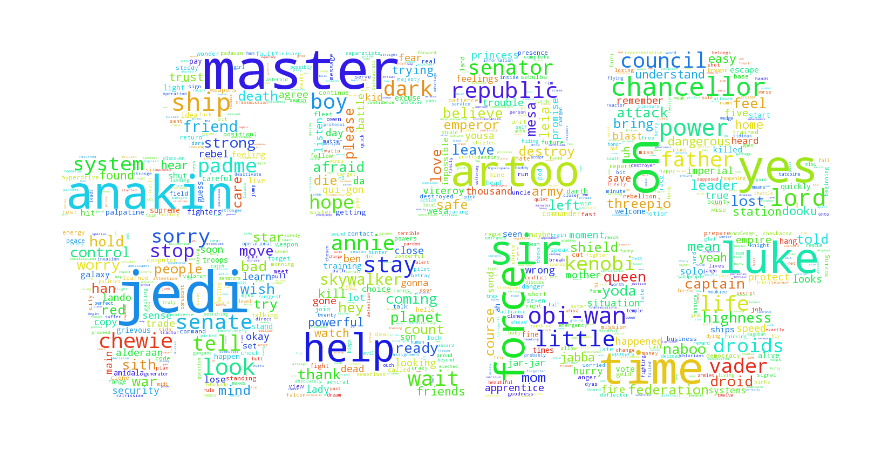

In [69]:
mask = imread('masks/star_wars.png')
# resize maks 
ratio = 800. / mask.shape[0]
mask = resize(mask, (800, int(mask.shape[1] * ratio)), preserve_range=True)
# set background color 
bground = 'white'
# set the colormap function
cfunc = partial(cfunc, hrange=hrange)
hrange += 40
# generate the wordcloud and display
frequencies = Counter(text) 
wordcloud = WordCloud(relative_scaling=.5,
                      max_words=10000, mask=mask, background_color=bground,
                      ).generate_from_frequencies(frequencies.items())
wordcloud.to_file('imgs/star_wars.png')
pl.figure(figsize=(15, 15))
pl.imshow(wordcloud, cmap=pl.cm.gray)
pl.axis('off')
pl.show()